In [1]:
# Uncomment one of thes if you don't have pandas-profiling installed
# See details here: https://github.com/pandas-profiling/pandas-profiling

# !pip install pandas-profiling[notebook]
# !conda install -c conda-forge pandas-profiling

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from pandas_profiling import ProfileReport

%matplotlib inline

Let's take a look at the data we have

In [2]:
df = pd.read_csv('./data/survey_results_public.csv')
df.head(2).T

,0,1
ResponseId,1,2
MainBranch,I am a developer by profession,I am a student who is learning to code
Employment,"Independent contractor, freelancer, or self-em...","Student, full-time"
Country,Slovakia,Netherlands
US_State,NaN,NaN
UK_Country,NaN,NaN
EdLevel,"Secondary school (e.g. American high school, G...","Bachelor’s degree (B.A., B.S., B.Eng., etc.)"
Age1stCode,18 - 24 years,11 - 17 years
LearnCode,Coding Bootcamp;Other online resources (ex: vi...,"Other online resources (ex: videos, blogs, etc..."
YearsCode,NaN,7


In [3]:
df.shape[0]

83439

Our main task is to predict an expected annual salary **ConvertedCompYearly**.

## Preprocessing

First of all, let's drop all rows that doesn't contain salary info and column with useless id. Also we'll drop all salary-related columns.

In [4]:
df.dropna(subset=['ConvertedCompYearly'], inplace=True)
df.drop(['ResponseId', 'CompTotal', 'CompFreq'], axis=1, inplace=True)

In [5]:
df.shape[0]

46844

Secondly, we create a pandas-profile report with entire analysis of missing variables, common problems, etc. During this EDA we'll try to fix all (or some) warnings we get from pandas-profiling.

In [6]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Drop clearly unnecessary stuff

In [7]:
columns_to_drop = [
    'US_State', # most of this data is missing
    'UK_Country', # most of this data is missing
    
    # I have no idea if these can bring something useful...
    'Trans',
    'Sexuality',
    'Accessibility',
    'MentalHealth',
    
    # these features showed high correlation with
    # corresponding 'xxxHaveToWorkWith'
    'LanguageWantToWorkWith',
    'DatabaseWantToWorkWith',
    'PlatformWantToWorkWith',
    'WebframeWantToWorkWith',
    'MiscTechWantToWorkWith',
    'ToolsTechWantToWorkWith',
    'NEWCollabToolsWantToWorkWith'
]

df.drop(columns_to_drop, axis=1, inplace=True)

Leave only top-$k$ most common options for categorical data. All other observations will go to 'Other'.

In [8]:
def leave_top_k(col, k=5):
    top_k = df[col].value_counts()[:k].keys()
    df[col] = df[col].mask(~df[col].isin(top_k), 'Other')

    
for col in ['Country', 'EdLevel', 'Age1stCode', 'OrgSize', 'Currency', 'Gender', 'Ethnicity']:
    leave_top_k(col)

Handle YearsCode and YearsCodePro features, making them numeric. Ignore the warning, it's alright.

In [9]:
for col in ['YearsCode', 'YearsCodePro']:
    df[col] = df[col].mask(df[col] == 'Less than 1 year', 0)
    df[col] = df[col].mask(df[col] == 'More than 50 years', 50)
    # just drop observations that do not have info
    df = df[~df[col].isna()]
    # cast to int type

df = df.astype({ 'YearsCode': 'int32', 'YearsCodePro': 'int32'})

/var/folders/pd/6lrw8yr17sl4gc5vw6xbqnfc0000gn/T/ipykernel_12611/3452883285.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].mask(df[col] == 'Less than 1 year', 0)
/var/folders/pd/6lrw8yr17sl4gc5vw6xbqnfc0000gn/T/ipykernel_12611/3452883285.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].mask(df[col] == 'More than 50 years', 50)


Check out the distribution of the salary

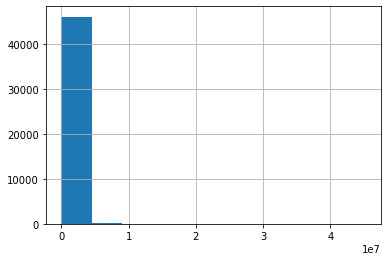

In [10]:
df['ConvertedCompYearly'].hist();

Filter some outliers.

In [11]:
df = df[
    (df['ConvertedCompYearly'] > df['ConvertedCompYearly'].quantile(.05)) &
    (df['ConvertedCompYearly'] < df['ConvertedCompYearly'].quantile(.95))
]

Checkout the distribution again. Now it should be fine.

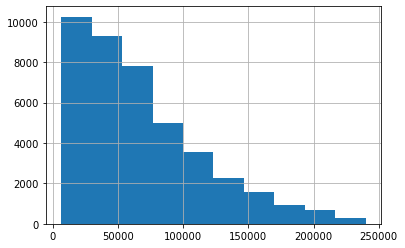

In [12]:
df['ConvertedCompYearly'].hist();

Generate at most $3$ features for text data

In [13]:
from collections import Counter

def generate_features_from_multiple_choices(col, k=3):
    """
    k is a maximal number of features to be generated
    """
    cnt = Counter()
    for el in df[col]:
        for feature in str(el).split(';'):
            cnt[feature] += 1
    del cnt['nan']
    
    for feature in [el[0] for el in cnt.most_common(k)]:
        df[f'{col}_{feature}'] = df[col].apply(lambda text: feature in str(text))
    df.drop(col, axis=1, inplace=True)

        
for col in ['LearnCode',
            'DevType',
            'LanguageHaveWorkedWith',
            'DatabaseHaveWorkedWith',
            'PlatformHaveWorkedWith',
            'WebframeHaveWorkedWith',
            'MiscTechHaveWorkedWith',
            'ToolsTechHaveWorkedWith',
            'NEWCollabToolsHaveWorkedWith',
            'NEWStuck',
            'NEWSOSites'
           ]:
    generate_features_from_multiple_choices(col)

Finally, have a look at what we got!

In [14]:
df.shape

(41636, 54)

In [15]:
df.head(2).T

,9,11
MainBranch,I am a developer by profession,I am a developer by profession
Employment,Employed full-time,Employed full-time
Country,Other,Other
EdLevel,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)"
Age1stCode,11 - 17 years,11 - 17 years
YearsCode,7,12
YearsCodePro,4,5
OrgSize,Other,Other
Currency,Other,EUR European Euro
OpSys,Linux-based,Linux-based


Let's do pandas-profiling again and see the result. It might take a bit longer since previous run. Of course, some of the generated features will be highly correlated.

In [16]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Drop rows with Age in [nan, 'Under 18 years old', 'Prefer not to say', '65 years or older'] and Age1stCode with value 'Other' and replace categorical values to average numeric for Age and Age1stCode

In [16]:
df = df[(df['Age'].notna()) & (df['Age'] != 'Under 18 years old') &
   (df['Age'] != 'Prefer not to say') & (df['Age'] != '65 years or older') & (df['Age1stCode'] != 'Other')]

look_up_age = {'25-34 years old': 29.5, '45-54 years old': 29.5, '35-44 years old': 39.5,
       '18-24 years old': 21, '55-64 years old': 59.5}
look_up_age_1st_code = {'11 - 17 years': 14, '5 - 10 years': 7.5, '25 - 34 years': 29.5, '18 - 24 years': 21,
       '35 - 44 years': 39.5}
age = df['Age'].apply(lambda v: look_up_age[v])
age_1st_code = df['Age1stCode'].apply(lambda v: look_up_age_1st_code[v])
df = df.drop(columns=['Age', 'Age1stCode'])
df['Age'] = age
df['Age1stCode'] = age_1st_code
df.T

,9,11,12,16,17,18,23,24,26,27,...,83424,83425,83428,83430,83431,83432,83433,83434,83436,83438
MainBranch,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,"I am not primarily a developer, but I write co...",I am a developer by profession,I am a developer by profession,"I am not primarily a developer, but I write co...",I am a developer by profession,...,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession,I am a developer by profession
Employment,Employed full-time,Employed full-time,Employed full-time,Employed full-time,Employed full-time,I prefer not to say,Employed full-time,Employed full-time,Employed full-time,Employed full-time,...,Employed full-time,Employed full-time,Employed full-time,Employed full-time,"Independent contractor, freelancer, or self-em...",Employed full-time,"Independent contractor, freelancer, or self-em...",Employed full-time,Employed full-time,Employed full-time
Country,Other,Other,Germany,Other,Canada,Other,Other,Germany,Other,United Kingdom of Great Britain and Northern I...,...,Germany,Other,Other,United States of America,Other,Canada,Other,United States of America,United States of America,Other
EdLevel,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Other doctoral degree (Ph.D., Ed.D., etc.)","Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Secondary school (e.g. American high school, G...","Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)","Secondary school (e.g. American high school, G...",Other
YearsCode,7,12,15,6,9,40,9,26,14,39,...,17,5,12,23,9,5,15,6,10,14
YearsCodePro,4,5,6,2,6,30,2,18,5,21,...,12,3,7,21,4,0,11,5,4,4
OrgSize,Other,Other,"1,000 to 4,999 employees",100 to 499 employees,Other,Other,Other,"1,000 to 4,999 employees",Other,Other,...,"10,000 or more employees",Other,20 to 99 employees,Other,2 to 9 employees,"10,000 or more employees","1,000 to 4,999 employees",20 to 99 employees,"10,000 or more employees",Other
Currency,Other,EUR European Euro,EUR European Euro,Other,CAD\tCanadian dollar,Other,EUR European Euro,EUR European Euro,Other,GBP\tPound sterling,...,EUR European Euro,EUR European Euro,Other,USD\tUnited States dollar,Other,CAD\tCanadian dollar,Other,USD\tUnited States dollar,USD\tUnited States dollar,Other
OpSys,Linux-based,Linux-based,Linux-based,Windows,MacOS,Linux-based,Linux-based,Linux-based,Linux-based,Linux-based,...,MacOS,Windows,MacOS,Linux-based,Windows,MacOS,MacOS,MacOS,Windows,Linux-based
SOVisitFreq,Multiple times per day,Daily or almost daily,Multiple times per day,Multiple times per day,Multiple times per day,Multiple times per day,A few times per week,Multiple times per day,Multiple times per day,Multiple times per day,...,A few times per week,Multiple times per day,A few times per week,A few times per week,Multiple times per day,Daily or almost daily,Daily or almost daily,A few times per week,A few times per week,A few times per week


Last step is to fill nans with 'N/A' values

In [17]:
df = df.fillna('N/A')

In [18]:
X = df.drop('ConvertedCompYearly', axis=1)
y = df['ConvertedCompYearly']

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

Save all processed data to csv:

In [22]:
X_train.to_csv('./data/processed/X_train.csv', index=False)
X_val.to_csv('./data/processed/X_val.csv', index=False)
X_test.to_csv('./data/processed/X_test.csv', index=False)

In [23]:
y_train.to_csv('./data/processed/y_train.csv', index=False)
y_val.to_csv('./data/processed/y_val.csv', index=False)
y_test.to_csv('./data/processed/y_test.csv', index=False)

### Some additional useful stuff

If your algorithm doesn't need OHE

If you need OHE

In [22]:
def ohe(df: pd.DataFrame):
    X = df.drop('ConvertedCompYearly', axis=1)
    y = df['ConvertedCompYearly']
    
    cat_cols = X.select_dtypes(include=['object']).columns
    for col in  cat_cols:
        X = pd.concat([X.drop(col, axis=1),
                       pd.get_dummies(X[col], prefix=col, prefix_sep='_', drop_first=True)],
                       axis=1)
    
    return X, y
    
X, y = ohe(df)

Of course, you may need additional preprocessing (like normalizing) suitable for your algorithm. But these $X$ and $y$ above provide a good starting point.